In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import math
import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

import keras
from tensorflow import keras
from keras import Sequential
from keras import layers
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Dropout, Activation, BatchNormalization, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams['figure.dpi'] = 300
colors = ["#B6EE56", "#D85F9C", "#EEA756", "#56EEE8"]

2023-12-08 02:14:04.290819: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-08 02:14:04.450219: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-08 02:14:07.105180: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/cuda/lib64:
2023-12-08 02:14:07.105344: W tensorflow/c

In [2]:
import tensorflow as tf
try:
    if tf.test.gpu_device_name():
        physical_devices = tf.config.experimental.list_physical_devices('GPU')
        print('GPU active! -', physical_devices)
    else:
        print('GPU not active!')
except Exception as e:
    print('An error occurred while checking the GPU:', e)

GPU active! - [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


2023-12-08 02:14:09.091116: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-08 02:14:10.793916: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /device:GPU:0 with 30969 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:3b:00.0, compute capability: 7.0
2023-12-08 02:14:10.795407: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /device:GPU:1 with 14619 MB memory:  -> device: 1, name: Tesla V100-PCIE-16GB, pci bus id: 0000:86:00.0, compute capability: 7.0


A search has been initiated within the folder named 'train'.
There are 1372 images in the nevus folder.
There are 254 images in the seborrheic_keratosis folder.
There are 374 images in the melanoma folder.
The search has been completed.


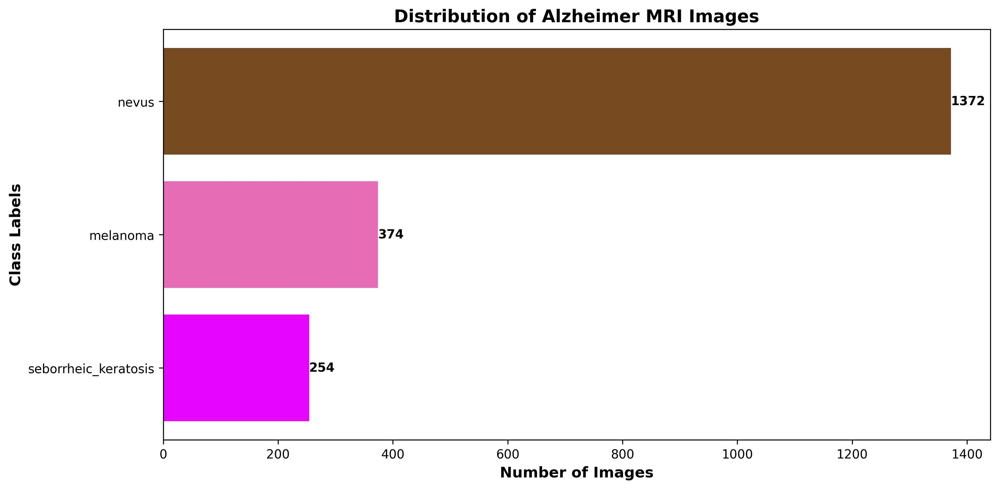

In [3]:
import os
import matplotlib.pyplot as plt
import random

class_dist = {}

def image_counter(folder_path):
    basename = os.path.basename(folder_path)
    print('\033[92m'+f"A search has been initiated within the folder named '{basename}'."+'\033[0m')
    image_extensions = ['.jpg', '.jpeg', '.png']
    
    for root, dirs, _ in os.walk(folder_path):
        for dir_name in dirs:
            dir_path = os.path.join(root, dir_name)
            count = 0
            
            for filename in os.listdir(dir_path):
                file_ext = os.path.splitext(filename)[1].lower()
                
                if file_ext in image_extensions:
                    count += 1
                    
            class_dist[dir_name] = count
            print(f"There are \033[35m{count}\033[0m images in the {dir_name} folder.")
    
    print('\033[92m'+"The search has been completed."+'\033[0m')

    # Sort the class_dist dictionary by the number of images (descending)
    sorted_class_dist = dict(sorted(class_dist.items(), key=lambda item: item[1], reverse=True))

    # Extract class names and counts
    class_names = list(sorted_class_dist.keys())
    class_counts = list(sorted_class_dist.values())

    # Generate colors for the bars
    colors = [f'#{random.randint(0, 0xFFFFFF):06x}' for _ in class_names]

    # Create a bar graph
    plt.figure(figsize=(12, 6))
    plt.barh(class_names, class_counts, color=colors)
    plt.xlabel('Number of Images', fontsize=12, fontweight="bold")
    plt.ylabel('Class Labels', fontsize=12, fontweight="bold")
    plt.title('Distribution of Alzheimer MRI Images', fontsize=14, fontweight="bold")
    plt.gca().invert_yaxis()  # Invert y-axis to have the highest count at the top

    # Annotate each bar with its respective count
    for i, count in enumerate(class_counts):
        plt.text(count, i, str(count), va='center', fontsize=10, fontweight="bold", color='black')

    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

PATH = '/home/seraj22200/bip_project/skin-lesion-analysis-toward-melanoma-detection/skin-lesions/train'
image_counter(PATH)


In [4]:
train_data = tf.keras.utils.image_dataset_from_directory(PATH,
                                                batch_size = 32,
                                                image_size=(256, 256),
                                                shuffle=True,
                                                seed=42,)

class_names = train_data.class_names

Found 2000 files belonging to 3 classes.


2023-12-08 02:14:11.662759: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30969 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:3b:00.0, compute capability: 7.0
2023-12-08 02:14:11.663990: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 14619 MB memory:  -> device: 1, name: Tesla V100-PCIE-16GB, pci bus id: 0000:86:00.0, compute capability: 7.0


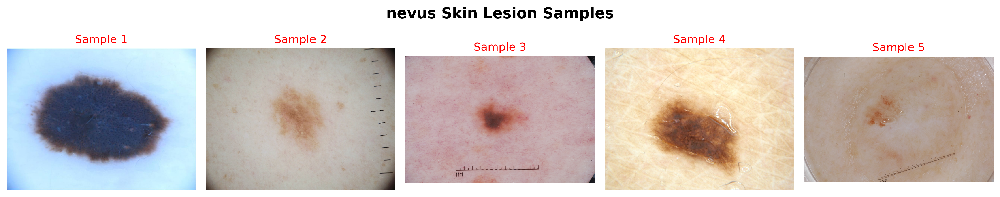

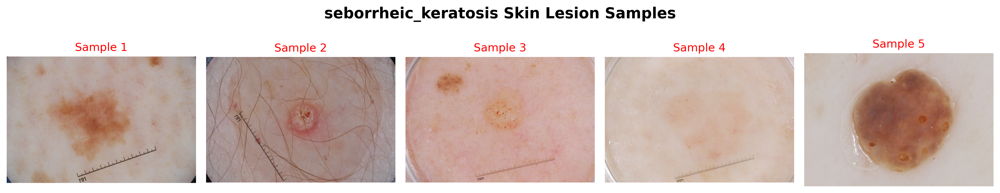

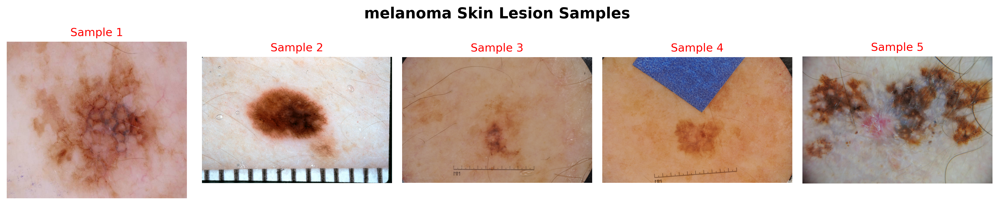

In [5]:
import os
import matplotlib.pyplot as plt
import random
import matplotlib.image as mpimg

def sample_bringer(path, num_samples=5):
    class_names = os.listdir(path)
    
    for target in class_names:
        class_path = os.path.join(path, target)
        image_files = [image for image in os.listdir(class_path) if image.endswith('.jpg')]
        
        # Skip classes with fewer than num_samples images
        if len(image_files) < num_samples:
            continue
        
        # Create a figure with a grid of subplots
        fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
        fig.suptitle(f'{target} Skin Lesion Samples', fontsize=16, fontweight='bold', color="black", y=1)
        
        random.shuffle(image_files)  # Randomly shuffle the image files
        
        for i in range(num_samples):
            image_path = os.path.join(class_path, image_files[i])
            img = mpimg.imread(image_path)
            
            axs[i].imshow(img, cmap='gray')  # Display images in grayscale
            axs[i].axis('off')
            axs[i].set_title(f'Sample {i+1}', color="red")
        
        plt.tight_layout()
        plt.show()  # Show each class's sample images

PATH = '/home/seraj22200/bip_project/skin-lesion-analysis-toward-melanoma-detection/skin-lesions/train'

sample_bringer(PATH)


In [6]:
skin_dict = {index: img for index, img in enumerate(train_data.class_names)}

class Process:
    def __init__(self, data):
        self.data = data.map(lambda x, y: (x/255, y))

    def create_new_batch(self):
        self.batch = self.data.as_numpy_iterator().next()
        text = "Min and max pixel values in the batch ->"
        print(text, self.batch[0].min(), "&", self.batch[0].max())
        
    def show_batch_images(self, number_of_images=5):
        fig, ax = plt.subplots(ncols=number_of_images, figsize=(20,20), facecolor="gray")
        fig.suptitle("Skin Lesion Samples in the Batch", color="yellow",fontsize=18, fontweight='bold', y=0.6)
        for idx, img in enumerate(self.batch[0][:number_of_images]):
            ax[idx].imshow(img)
            class_no = self.batch[1][idx]
            ax[idx].set_title(skin_dict[class_no], color="aqua")
            ax[idx].set_xticklabels([])
            ax[idx].set_yticklabels([])
    
    def train_test_val_split(self, train_size, val_size, test_size):

        train = int(len(self.data)*train_size)
        test = int(len(self.data)*test_size)
        val = int(len(self.data)*val_size)
        
        train_data = self.data.take(train)
        val_data = self.data.skip(train).take(val)
        test_data = self.data.skip(train+val).take(test)

        return train_data, val_data, test_data

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Min and max pixel values in the batch -> 0.0 & 1.0


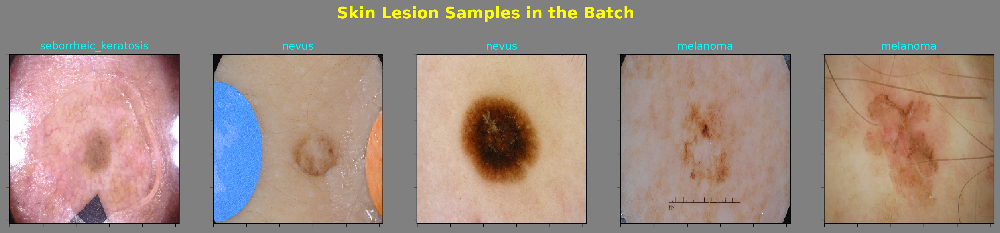

In [7]:
process = Process(train_data)
process.create_new_batch()
process.show_batch_images(number_of_images=5)

In [8]:

import tensorflow as tf
import matplotlib.pyplot as plt

valid_path = '/home/seraj22200/bip_project/skin-lesion-analysis-toward-melanoma-detection/skin-lesions/valid'

# Corrected code to create the dataset
valid_data = tf.keras.utils.image_dataset_from_directory(
    directory=valid_path,  # Use 'directory' instead of 'PATH'
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=42,
)

valid_class_names = valid_data.class_names


Found 150 files belonging to 3 classes.


In [9]:
# Instantiate the Process class
process = Process(train_data)

# Apply processing to the data
processed_data = process.data

# Split the processed data into training and testing sets
train_size = int(0.8 * len(processed_data))
test_size = int(0.2 * len(processed_data))

train_data = processed_data.take(train_size)
test_data = processed_data.skip(train_size)

# Create x_train, y_train, x_test, and y_test
x_train, y_train = zip(*[(image, label) for image, label in train_data])
x_test, y_test = zip(*[(image, label) for image, label in test_data])

# Convert to NumPy arrays
x_train = tf.concat(x_train, axis=0).numpy()
y_train = tf.concat(y_train, axis=0).numpy()
x_test = tf.concat(x_test, axis=0).numpy()
y_test = tf.concat(y_test, axis=0).numpy()

# Print shapes of the datasets
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)


x_train shape: (1600, 256, 256, 3)
y_train shape: (1600,)
x_test shape: (400, 256, 256, 3)
y_test shape: (400,)


In [10]:
# Find unique values in y_train and y_test
unique_y_train = set(y_train)
unique_y_test = set(y_test)

# Print unique values and their counts
print("Unique values in y_train:", unique_y_train)
print("Unique values in y_test:", unique_y_test)

# Assuming skin_dict is a dictionary mapping numeric values to class labels
class_labels_train = [skin_dict[i] for i in unique_y_train]
class_labels_test = [skin_dict[i] for i in unique_y_test]

print("Class labels for unique values in y_train:", class_labels_train)
print("Class labels for unique values in y_test:", class_labels_test)


Unique values in y_train: {0, 1, 2}
Unique values in y_test: {0, 1, 2}
Class labels for unique values in y_train: ['melanoma', 'nevus', 'seborrheic_keratosis']
Class labels for unique values in y_test: ['melanoma', 'nevus', 'seborrheic_keratosis']


In [11]:
def build_model():
    model = Sequential()
    
    model.add(Conv2D(filters=16, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal',
                     input_shape=(256, 256, 3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation="relu", kernel_initializer='he_normal'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_initializer='he_normal'))
    # model.add(Dense(64, activation="relu"))
    model.add(Dense(3, activation="softmax"))

    model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])
    
    model.summary()
    
    return model

model = build_model()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       36992     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 128)      0

In [12]:
def checkpoint_callback():
    
    checkpoint_filepath = '/tmp/checkpoint'
    
    model_checkpoint_callback= ModelCheckpoint(filepath=checkpoint_filepath,
                           save_weights_only=False,
                           frequency='epoch',
                           monitor='val_accuracy',
                           save_best_only=True,
                           verbose=1)
    
    return model_checkpoint_callback

def early_stopping(patience):
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    return es_callback


EPOCHS = 20
checkpoint_callback = checkpoint_callback()
early_stopping = early_stopping(patience=5)
callbacks = [checkpoint_callback, early_stopping]

In [13]:
model_history = model.fit(x_train,y_train,validation_data=(x_test,y_test), batch_size=20,epochs=1000,callbacks=callbacks)

Epoch 1/1000


2023-12-08 02:15:23.599988: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8204
2023-12-08 02:15:30.936040: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f656b578f70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-08 02:15:30.936094: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla V100-PCIE-32GB, Compute Capability 7.0
2023-12-08 02:15:30.936102: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): Tesla V100-PCIE-16GB, Compute Capability 7.0
2023-12-08 02:15:31.158537: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-12-08 02:15:32.302003: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


77/80 [===========================>..] - ETA: 0s - loss: 2.2081 - accuracy: 0.6623
Epoch 1: val_accuracy improved from -inf to 0.71750, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 21s 54ms/step - loss: 2.1547 - accuracy: 0.6662 - val_loss: 0.7753 - val_accuracy: 0.7175
Epoch 2/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.7838 - accuracy: 0.6857
Epoch 2: val_accuracy did not improve from 0.71750
80/80 [==============================] - 1s 17ms/step - loss: 0.7855 - accuracy: 0.6837 - val_loss: 0.7472 - val_accuracy: 0.6975
Epoch 3/1000
80/80 [==============================] - ETA: 0s - loss: 0.7348 - accuracy: 0.6969
Epoch 3: val_accuracy improved from 0.71750 to 0.73250, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 4s 47ms/step - loss: 0.7348 - accuracy: 0.6969 - val_loss: 0.6819 - val_accuracy: 0.7325
Epoch 4/1000
79/80 [============================>.] - ETA: 0s - loss: 0.6452 - accuracy: 0.7361
Epoch 4: val_accuracy improved from 0.73250 to 0.74000, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 4s 45ms/step - loss: 0.6444 - accuracy: 0.7356 - val_loss: 0.6569 - val_accuracy: 0.7400
Epoch 5/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.5935 - accuracy: 0.7565
Epoch 5: val_accuracy did not improve from 0.74000
80/80 [==============================] - 1s 17ms/step - loss: 0.5928 - accuracy: 0.7588 - val_loss: 0.7211 - val_accuracy: 0.7125
Epoch 6/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.5459 - accuracy: 0.7838
Epoch 6: val_accuracy improved from 0.74000 to 0.74250, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 4s 46ms/step - loss: 0.5481 - accuracy: 0.7831 - val_loss: 0.7286 - val_accuracy: 0.7425
Epoch 7/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.4570 - accuracy: 0.8221
Epoch 7: val_accuracy improved from 0.74250 to 0.75000, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 3s 43ms/step - loss: 0.4625 - accuracy: 0.8169 - val_loss: 0.8061 - val_accuracy: 0.7500
Epoch 8/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.3815 - accuracy: 0.8481
Epoch 8: val_accuracy improved from 0.75000 to 0.77500, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 4s 48ms/step - loss: 0.3804 - accuracy: 0.8506 - val_loss: 0.7390 - val_accuracy: 0.7750
Epoch 9/1000
77/80 [===========================>..] - ETA: 0s - loss: 0.3473 - accuracy: 0.8721
Epoch 9: val_accuracy improved from 0.77500 to 0.78750, saving model to /tmp/checkpoint


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


INFO:tensorflow:Assets written to: /tmp/checkpoint/assets


80/80 [==============================] - 3s 40ms/step - loss: 0.3478 - accuracy: 0.8712 - val_loss: 0.8210 - val_accuracy: 0.7875
Epoch 9: early stopping


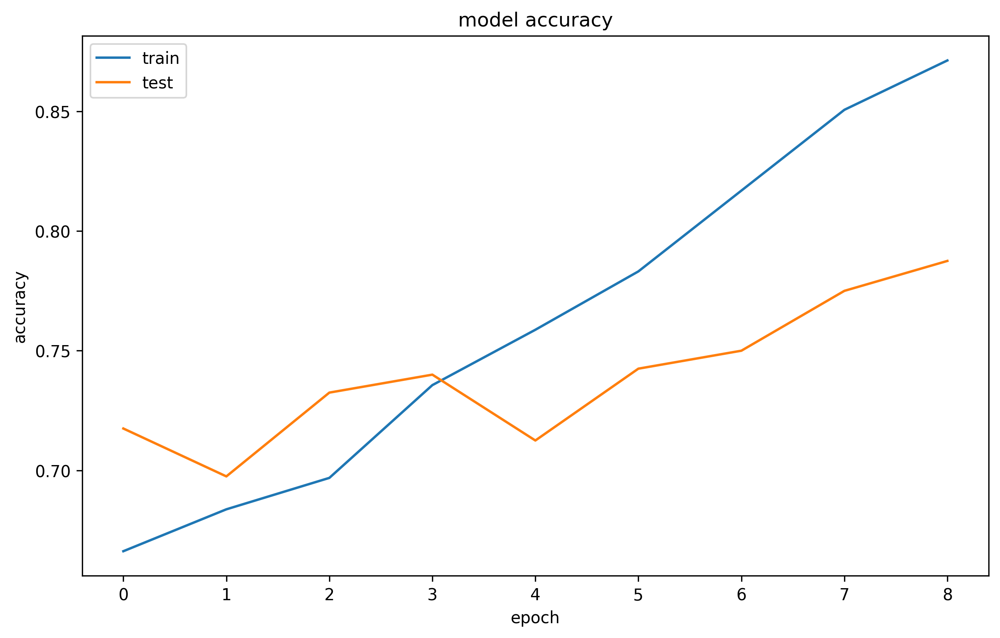

In [14]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

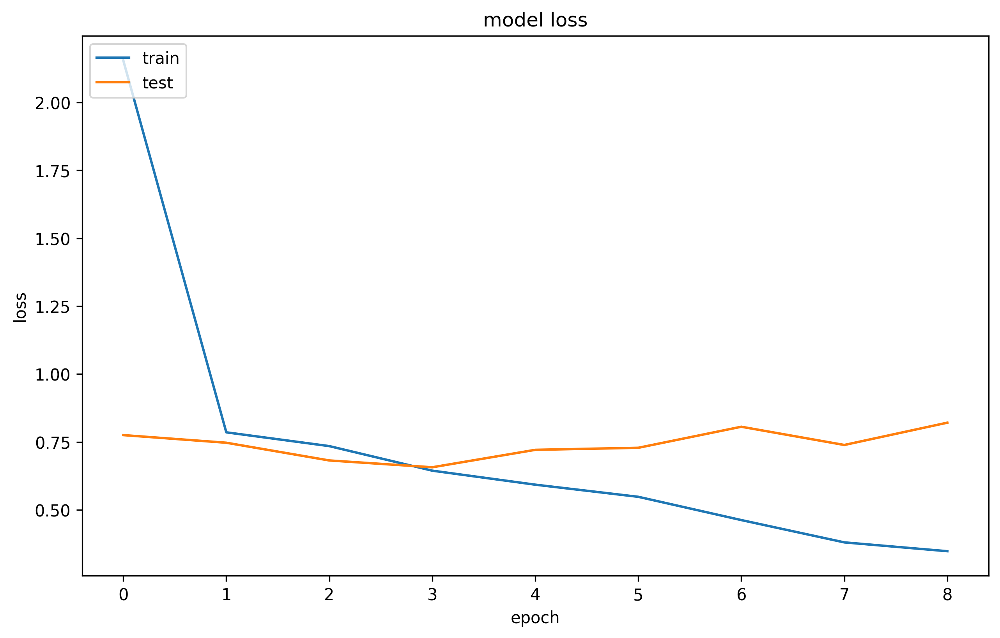

In [15]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [16]:
## Making the prediction and evaluation the model
# Prediction the Test set results
y_pred = model.predict(x_test)
# y_pred = (y_pred >=0.5)
y_pred


13/13 [==============================] - 0s 16ms/step


array([[1.5390706e-02, 9.8460603e-01, 3.3373938e-06],
       [1.5068375e-01, 5.1719981e-01, 3.3211643e-01],
       [4.0335278e-03, 9.9596429e-01, 2.1507553e-06],
       ...,
       [3.2490066e-01, 6.3724124e-01, 3.7858076e-02],
       [1.3111384e-01, 8.6878425e-01, 1.0188500e-04],
       [7.4638838e-01, 2.2927269e-01, 2.4338964e-02]], dtype=float32)

In [17]:
from sklearn.metrics import accuracy_score

# Assuming y_pred contains continuous values, convert them to class labels
y_pred_classes = np.argmax(y_pred, axis=1)

# Calculate accuracy
score = accuracy_score(y_test, y_pred_classes)
print("Accuracy score:", score)


Accuracy score: 0.7875


In [18]:
from sklearn.metrics import classification_report

# Assuming y_pred contains continuous values, convert them to class labels
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate the classification report using class_labels as target_names
target_names = [str(label) for label in class_labels_train]
report = classification_report(y_test, y_pred_classes, target_names=target_names)

# Print the classification report
print(report)


                      precision    recall  f1-score   support

            melanoma       0.62      0.41      0.49        64
               nevus       0.82      0.92      0.87       284
seborrheic_keratosis       0.71      0.52      0.60        52

            accuracy                           0.79       400
           macro avg       0.72      0.62      0.65       400
        weighted avg       0.77      0.79      0.77       400



Text(286.1666666666666, 0.5, 'True')

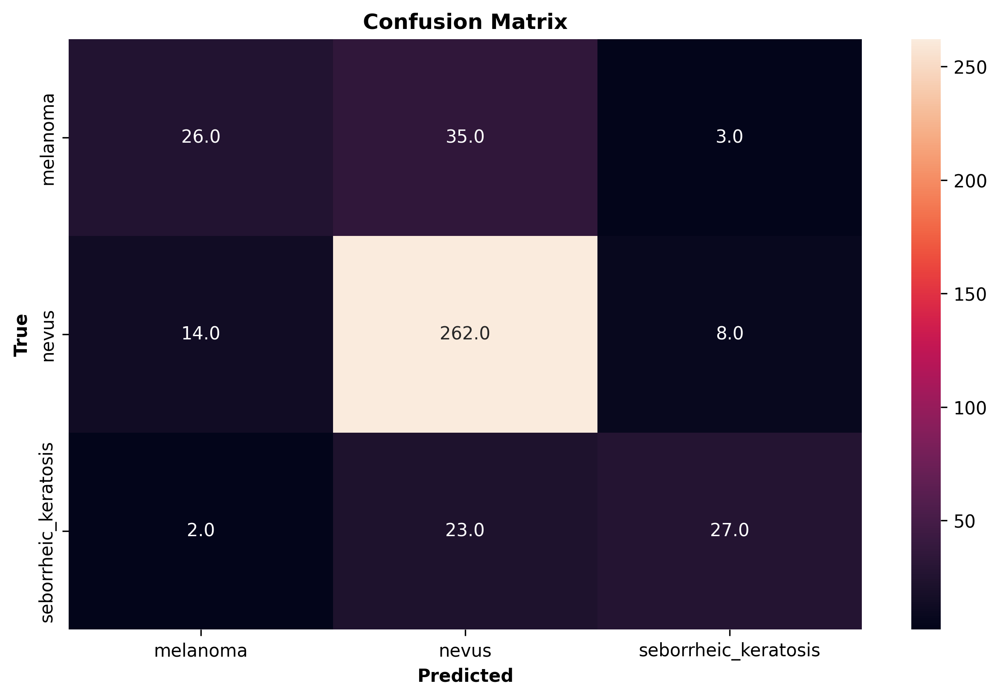

In [19]:
cm = confusion_matrix(y_test, y_pred_classes)
cm_df = pd.DataFrame(cm, index=class_labels_train, columns=class_labels_train)
cm_df
plt.figure(figsize=(10,6), dpi=300)
sns.heatmap(cm_df, annot=True, fmt=".1f")
plt.title("Confusion Matrix", fontweight="bold")
plt.xlabel("Predicted", fontweight="bold")
plt.ylabel("True", fontweight="bold")

1/1 [==============================] - 0s 73ms/step


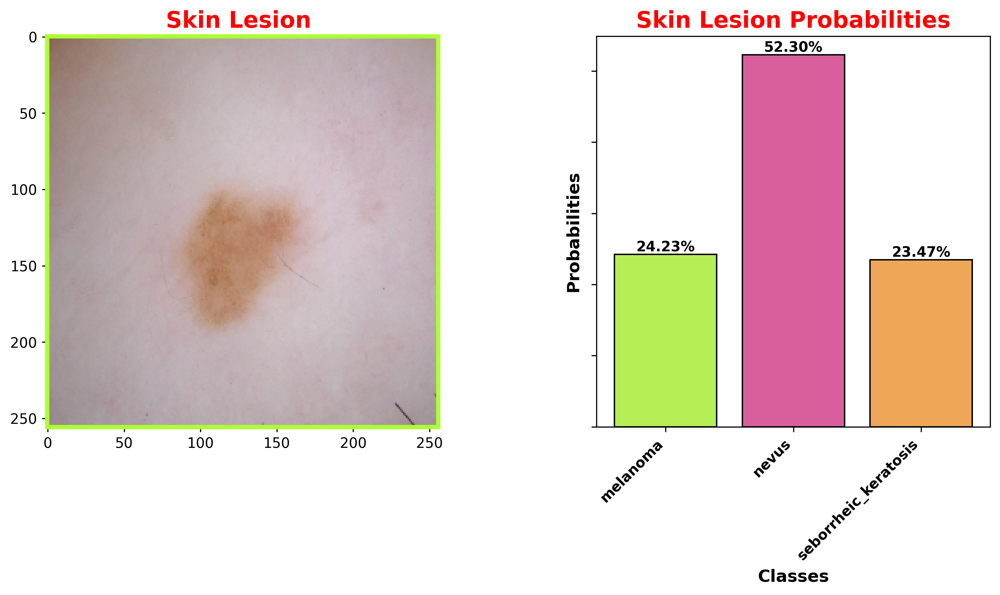

In [20]:
def random_mri_check(image_number=10):
    image = x_test[image_number]
    pred = model.predict(tf.expand_dims(image, 0))[0]

    probs = list(tf.nn.softmax(pred).numpy())
    probs_dict = dict(zip(class_labels_train, probs))

    keys = list(probs_dict.keys())
    values = list(probs_dict.values())

    fig, (ax1, ax2) = plt.subplots(1, 2, facecolor='white', figsize=(12, 5))
    plt.subplots_adjust(wspace=0.4)
    ax1.imshow(image)
    ax1.set_title('Skin Lesion ', color="red", fontweight="bold", fontsize=16)

    edges = ['left', 'bottom', 'right', 'top']
    edge_color = "greenyellow"
    edge_width = 3
    for edge in edges:
        ax1.spines[edge].set_linewidth(edge_width)
        ax1.spines[edge].set_edgecolor(edge_color)

    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])

    ax2.bar(keys, values, color=colors, edgecolor='black')
    ax2.set_title('Skin Lesion Probabilities', color="red", fontweight="bold", fontsize=16)
    ax2.set_xlabel('Classes', color="black", fontsize=12, fontweight="bold")
    ax2.set_ylabel('Probabilities', color="black", fontsize=12, fontweight="bold")
    ax2.tick_params(axis='x', labelrotation=45, labelcolor="white")
    ax2.tick_params(axis='y', labelcolor="white")

    # Add percentage labels to the bar graph
    for i, v in enumerate(values):
        ax2.text(i, v, f'{v * 100:.2f}%', color='black', va='bottom', ha='center', fontsize=10, fontweight="bold")

    # Add class names as x-axis labels
    ax2.set_xticks(range(len(class_labels_train)))
    ax2.set_xticklabels(class_labels_train, rotation=45, ha='right', fontsize=10, fontweight="bold", color="black")

rand_img_no = np.random.randint(1, len(x_test))
random_mri_check(image_number=rand_img_no)


1/1 [==============================] - 0s 30ms/step
This image is detected as nevus.


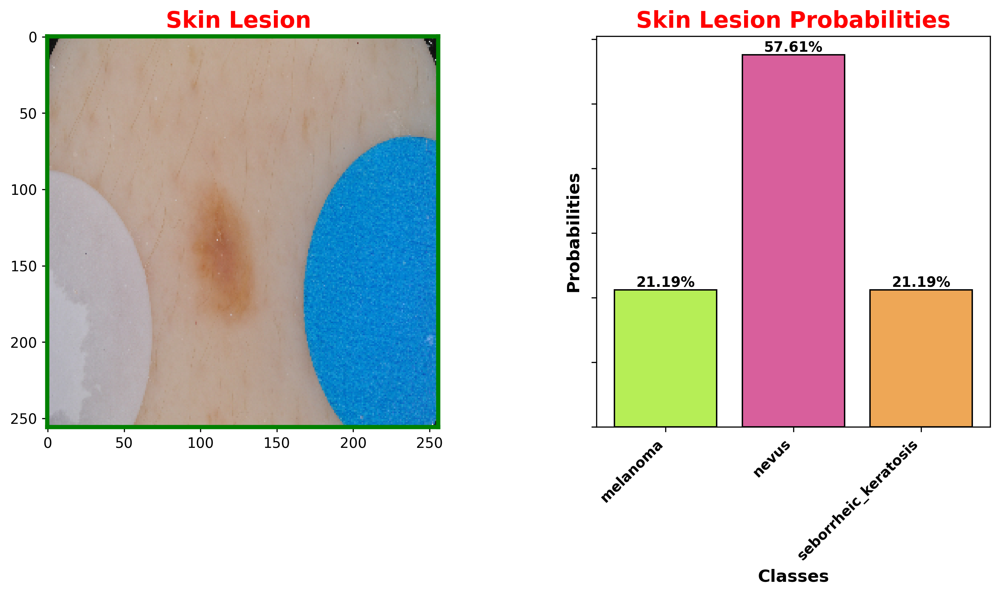

In [21]:
def random_skin_disease_check(image_number=10, threshold=0.5):
    image = x_test[image_number]
    pred = model.predict(tf.expand_dims(image, 0))[0]

    probs = list(tf.nn.softmax(pred).numpy())
    probs_dict = dict(zip(class_labels_train, probs))

    # Check if any class probability is greater or equal to the threshold
    detected_class = None
    for class_label, probability in probs_dict.items():
        if probability >= threshold:
            detected_class = class_label
            break

    keys = list(probs_dict.keys())
    values = list(probs_dict.values())

    fig, (ax1, ax2) = plt.subplots(1, 2, facecolor='white', figsize=(12, 5))
    plt.subplots_adjust(wspace=0.4)
    ax1.imshow(image)
    ax1.set_title('Skin Lesion ', color="red", fontweight="bold", fontsize=16)

    edges = ['left', 'bottom', 'right', 'top']
    edge_color = "green"
    edge_width = 3
    for edge in edges:
        ax1.spines[edge].set_linewidth(edge_width)
        ax1.spines[edge].set_edgecolor(edge_color)

    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])

    ax2.bar(keys, values, color=colors, edgecolor='black')
    ax2.set_title('Skin Lesion Probabilities', color="red", fontweight="bold", fontsize=16)
    ax2.set_xlabel('Classes', color="black", fontsize=12, fontweight="bold")
    ax2.set_ylabel('Probabilities', color="black", fontsize=12, fontweight="bold")
    ax2.tick_params(axis='x', labelrotation=45, labelcolor="white")
    ax2.tick_params(axis='y', labelcolor="white")

    # Add percentage labels to the bar graph
    for i, v in enumerate(values):
        ax2.text(i, v, f'{v * 100:.2f}%', color='black', va='bottom', ha='center', fontsize=10, fontweight="bold")

    # Add class names as x-axis labels
    ax2.set_xticks(range(len(class_labels_train)))
    ax2.set_xticklabels(class_labels_train, rotation=45, ha='right', fontsize=10, fontweight="bold", color="black")

    # Print detected class if any probability is greater or equal to the threshold
    if detected_class:
        print(f'This image is detected as {detected_class}.')

# Example usage:
rand_img_no = np.random.randint(1, len(x_test))
random_skin_disease_check(image_number=rand_img_no, threshold=0.5)


In [22]:
import cv2
import os

# Path to the image file
image_path = '/home/seraj22200/bip_project/skin-lesion-analysis-toward-melanoma-detection/skin-lesions/valid/melanoma/ISIC_0012099.jpg'

# Check if the file exists
if os.path.exists(image_path):
    # Read the image using OpenCV
    image = cv2.imread(image_path)

    # Get the shape of the image
    image_shape = image.shape

    print(f"The shape of the image at {image_path} is: {image_shape}")
else:
    print(f"The file at {image_path} does not exist.")


The shape of the image at /home/seraj22200/bip_project/skin-lesion-analysis-toward-melanoma-detection/skin-lesions/valid/melanoma/ISIC_0012099.jpg is: (2000, 3008, 3)
